# Implementation of a DCGAN Architecture with PyTorch

In this notebook, we develop and train a Deep Convolutional Generative Adversarial Network (DCGAN) capable of producing realistic artificial flower images. The model is trained using the [Oxford 102 Flower Dataset](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/), a collection of high-quality images spanning 102 different flower categories. Through adversarial training, the generator learns to synthesize visually plausible flowers, while the discriminator learns to distinguish real images from generated ones.


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
import os
import tarfile
import random
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torchvision.utils import save_image, make_grid
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

In [9]:
DATA_TGZ = "/content/drive/MyDrive/datasets/102flowers.tgz"
EXTRACT_DIR = "/content/flowers"
OUTPUT_DIR = "/content/drive/MyDrive/dcgan_flowers_64"

IMAGE_SIZE = 64
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 150
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [10]:
DEVICE

'cuda'

## Loading the Data

The Oxford 102 Flowers dataset contains photographs spanning 102 distinct flower categories. The dataset is provided as a compressed `.tar` archive. Before use, the archive is extracted into the directory specified by `EXTRACT_DIR`, making the image files accessible for preprocessing and training.


In [11]:
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

if not os.path.exists(EXTRACT_DIR):
    os.makedirs(EXTRACT_DIR)

if len(os.listdir(EXTRACT_DIR)) == 0:
    print("Extracting Oxford Flowers dataset...")
    with tarfile.open(DATA_TGZ, "r:gz") as tar:
        tar.extractall(EXTRACT_DIR)
else:
    print("Dataset already extracted.")

Extracting Oxford Flowers dataset...


/tmp/ipython-input-1852876431.py:10: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(EXTRACT_DIR)


In [12]:
IMAGE_FOLDER = os.path.join(EXTRACT_DIR, "jpg")
print("Images located in:", IMAGE_FOLDER)

Images located in: /content/flowers/jpg


In [13]:
image_paths = sorted([
    os.path.join(IMAGE_FOLDER, f)
    for f in os.listdir(IMAGE_FOLDER)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
])

In [14]:
print(f"Found {len(image_paths)} flower images.")

Found 8189 flower images.


## Data preprocessing
Images in the dataset vary in size, averaging roughly 500x500 pixels. For the purposes of this notebook:
 * Resize images to 64x64 before processing in order too maintain computational efficiency in Goolge Colab
 * Normalize images before processing around [-1, 1]

In [15]:
transform = transforms.Compose([transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)), transforms.ToTensor(), transforms.Normalize([0.5]*3, [0.5]*3),])

class FlowerDataset(Dataset):
    def __len__(self):
        return len(image_paths)

    def __getitem__(self, idx):
        img = Image.open(image_paths[idx]).convert("RGB")
        return transform(img)

dataloader = DataLoader(FlowerDataset(), batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)

## Building the Model

A Deep Convolutional Generative Adversarial Network (DCGAN) consists of two neural networks trained together in an adversarial setting:

- **Generator (G)**: Produces synthetic images from random noise.
- **Discriminator (D)**: Evaluates whether images are real (from the dataset) or fake (produced by the generator).

Both networks improve simultaneously through adversarial training.

---

### Generator

The generator performs the inverse operation of a convolutional network:

- Begins with a random noise vector `z` of size 100x1x1.
- Gradually upsamples this vector through a series of ConvTranspose2d layers.
- Uses Batch Normalization and ReLU activations to regulate feature scaling.
- Expands spatial resolution through the sequence  
  1x1 → 4x4 → 8x8 → 16x16 → 32x32 → 64x64.
- Produces a final 64x64 RGB image.
- Uses a tanh activation in the final layer to constrain outputs to the range [-1, 1].

The generator learns to synthesize images that closely resemble the real flowers in the dataset.

In [16]:
def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

class Generator(nn.Module):
    def __init__(self, z_dim):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh(),
        )

    def forward(self, z):
        return self.main(z)

### Discriminator

The discriminator is a convolutional neural network designed to distinguish real flower images from generated ones. In this project, its design follows established DCGAN guidelines:

- Uses strided convolutions to progressively downsample 64x64 images.
- Avoids pooling layers in favor of convolution-based downsampling.
- Employs LeakyReLU activations for stable gradient propagation.
- Includes Batch Normalization in deeper layers to improve training stability.
- Ends with a sigmoid output that estimates the probability that an input image is real.

The discriminator effectively learns the visual characteristics of real flower images.

In [17]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.main(x)

## Training the model
Training alternates between improving the discriminator and the generator:

### Training the Discriminator
- Real images are labeled as “real,” and generated images are labeled as “fake.”
- The discriminator is trained using Binary Cross-Entropy loss (BCE).
- The objective is to increase accuracy in distinguishing real images from generated ones.

### Training the Generator
- The generator produces images from random noise.
- These images are evaluated by the discriminator.
- The generator is trained to maximize the discriminator's probability of classifying the generated images as real.
- BCE loss is used, with generated images assigned the “real” label to encourage realism.

This adversarial loop continues for many epochs, progressively refining both models.

Starting training...


100%|██████████| 64/64 [00:27<00:00,  2.33it/s]


Epoch 1/150 | Loss_D: 0.0653 | Loss_G: 3.5040


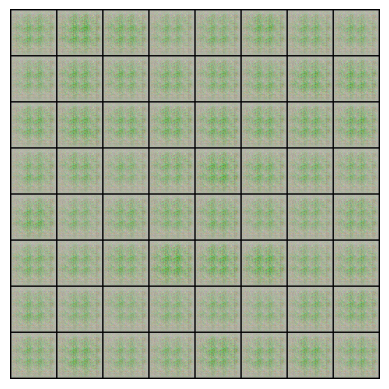

100%|██████████| 64/64 [00:26<00:00,  2.45it/s]


Epoch 2/150 | Loss_D: 0.0187 | Loss_G: 4.8255


100%|██████████| 64/64 [00:25<00:00,  2.48it/s]


Epoch 3/150 | Loss_D: 0.0119 | Loss_G: 5.5235


100%|██████████| 64/64 [00:26<00:00,  2.39it/s]


Epoch 4/150 | Loss_D: 0.0068 | Loss_G: 5.9987


100%|██████████| 64/64 [00:26<00:00,  2.37it/s]


Epoch 5/150 | Loss_D: 0.2989 | Loss_G: 3.5163


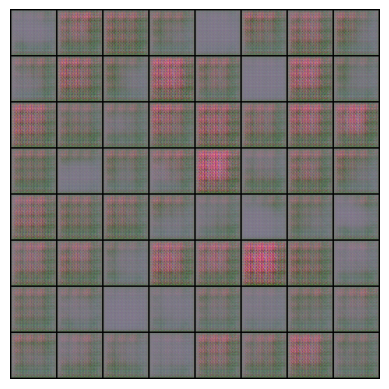

100%|██████████| 64/64 [00:26<00:00,  2.39it/s]


Epoch 6/150 | Loss_D: 0.4729 | Loss_G: 2.6285


100%|██████████| 64/64 [00:26<00:00,  2.38it/s]


Epoch 7/150 | Loss_D: 0.4964 | Loss_G: 1.9578


100%|██████████| 64/64 [00:26<00:00,  2.46it/s]


Epoch 8/150 | Loss_D: 0.4062 | Loss_G: 2.6867


100%|██████████| 64/64 [00:26<00:00,  2.41it/s]


Epoch 9/150 | Loss_D: 0.5848 | Loss_G: 1.9368


100%|██████████| 64/64 [00:26<00:00,  2.43it/s]


Epoch 10/150 | Loss_D: 0.5362 | Loss_G: 3.8730


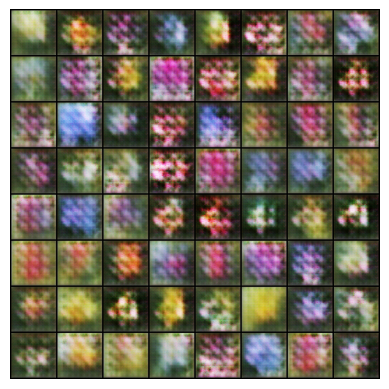

100%|██████████| 64/64 [00:26<00:00,  2.38it/s]


Epoch 11/150 | Loss_D: 0.5399 | Loss_G: 2.5121


100%|██████████| 64/64 [00:26<00:00,  2.43it/s]


Epoch 12/150 | Loss_D: 0.8060 | Loss_G: 1.8264


100%|██████████| 64/64 [00:25<00:00,  2.52it/s]


Epoch 13/150 | Loss_D: 0.7950 | Loss_G: 3.4914


100%|██████████| 64/64 [00:26<00:00,  2.38it/s]


Epoch 14/150 | Loss_D: 0.6310 | Loss_G: 3.1030


100%|██████████| 64/64 [00:26<00:00,  2.40it/s]


Epoch 15/150 | Loss_D: 0.6244 | Loss_G: 2.2497


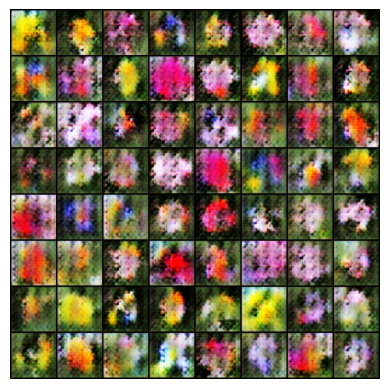

100%|██████████| 64/64 [00:26<00:00,  2.38it/s]


Epoch 16/150 | Loss_D: 0.7944 | Loss_G: 1.6037


100%|██████████| 64/64 [00:26<00:00,  2.39it/s]


Epoch 17/150 | Loss_D: 0.6459 | Loss_G: 2.2278


100%|██████████| 64/64 [00:27<00:00,  2.36it/s]


Epoch 18/150 | Loss_D: 1.2359 | Loss_G: 0.8887


100%|██████████| 64/64 [00:26<00:00,  2.38it/s]


Epoch 19/150 | Loss_D: 0.7209 | Loss_G: 1.6248


100%|██████████| 64/64 [00:27<00:00,  2.33it/s]


Epoch 20/150 | Loss_D: 0.8347 | Loss_G: 0.9655


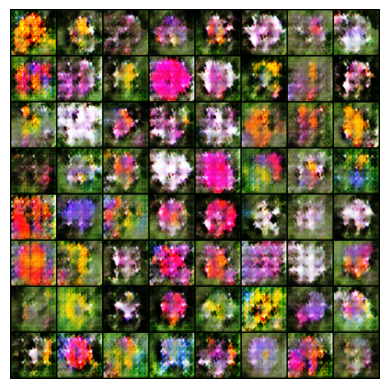

100%|██████████| 64/64 [00:25<00:00,  2.48it/s]


Epoch 21/150 | Loss_D: 0.7111 | Loss_G: 1.7338


100%|██████████| 64/64 [00:26<00:00,  2.40it/s]


Epoch 22/150 | Loss_D: 0.8310 | Loss_G: 2.6877


100%|██████████| 64/64 [00:27<00:00,  2.36it/s]


Epoch 23/150 | Loss_D: 0.7869 | Loss_G: 1.3367


100%|██████████| 64/64 [00:26<00:00,  2.39it/s]


Epoch 24/150 | Loss_D: 1.0209 | Loss_G: 3.1203


100%|██████████| 64/64 [00:26<00:00,  2.40it/s]


Epoch 25/150 | Loss_D: 0.7687 | Loss_G: 3.3463


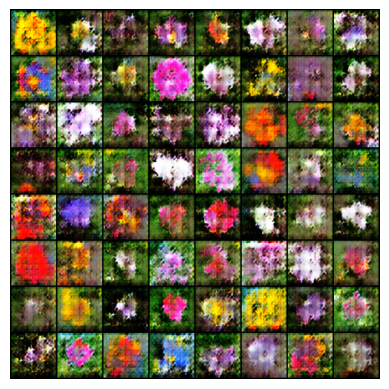

100%|██████████| 64/64 [00:27<00:00,  2.37it/s]


Epoch 26/150 | Loss_D: 0.7641 | Loss_G: 2.9862


100%|██████████| 64/64 [00:27<00:00,  2.35it/s]


Epoch 27/150 | Loss_D: 0.7711 | Loss_G: 1.3839


100%|██████████| 64/64 [00:27<00:00,  2.33it/s]


Epoch 28/150 | Loss_D: 0.6303 | Loss_G: 2.1698


100%|██████████| 64/64 [00:27<00:00,  2.32it/s]


Epoch 29/150 | Loss_D: 0.7676 | Loss_G: 1.9704


100%|██████████| 64/64 [00:26<00:00,  2.39it/s]


Epoch 30/150 | Loss_D: 0.7515 | Loss_G: 1.8218


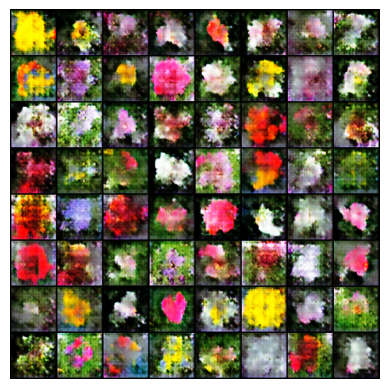

100%|██████████| 64/64 [00:26<00:00,  2.42it/s]


Epoch 31/150 | Loss_D: 0.8175 | Loss_G: 2.8095


100%|██████████| 64/64 [00:27<00:00,  2.36it/s]


Epoch 32/150 | Loss_D: 0.6071 | Loss_G: 2.6235


100%|██████████| 64/64 [00:28<00:00,  2.26it/s]


Epoch 33/150 | Loss_D: 0.7472 | Loss_G: 3.3913


100%|██████████| 64/64 [00:28<00:00,  2.26it/s]


Epoch 34/150 | Loss_D: 0.6443 | Loss_G: 3.2334


100%|██████████| 64/64 [00:27<00:00,  2.32it/s]


Epoch 35/150 | Loss_D: 0.7747 | Loss_G: 1.1927


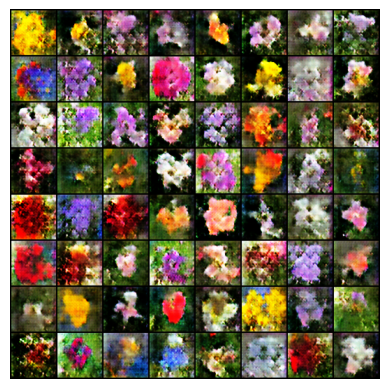

100%|██████████| 64/64 [00:28<00:00,  2.28it/s]


Epoch 36/150 | Loss_D: 0.8009 | Loss_G: 3.5971


100%|██████████| 64/64 [00:27<00:00,  2.33it/s]


Epoch 37/150 | Loss_D: 0.6739 | Loss_G: 1.7346


100%|██████████| 64/64 [00:28<00:00,  2.23it/s]


Epoch 38/150 | Loss_D: 0.9118 | Loss_G: 3.6380


100%|██████████| 64/64 [00:29<00:00,  2.21it/s]


Epoch 39/150 | Loss_D: 0.6919 | Loss_G: 3.5084


100%|██████████| 64/64 [00:28<00:00,  2.27it/s]


Epoch 40/150 | Loss_D: 0.7937 | Loss_G: 1.1032


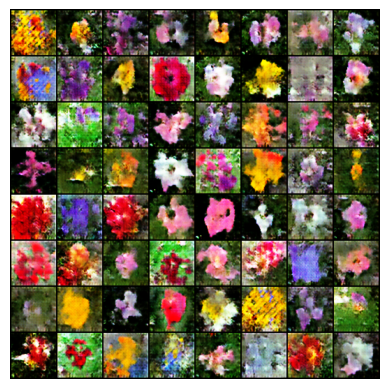

100%|██████████| 64/64 [00:28<00:00,  2.22it/s]


Epoch 41/150 | Loss_D: 0.5961 | Loss_G: 2.5401


100%|██████████| 64/64 [00:28<00:00,  2.27it/s]


Epoch 42/150 | Loss_D: 0.6841 | Loss_G: 1.3063


100%|██████████| 64/64 [00:28<00:00,  2.23it/s]


Epoch 43/150 | Loss_D: 0.7811 | Loss_G: 1.4591


100%|██████████| 64/64 [00:28<00:00,  2.24it/s]


Epoch 44/150 | Loss_D: 0.8662 | Loss_G: 1.3708


100%|██████████| 64/64 [00:28<00:00,  2.28it/s]


Epoch 45/150 | Loss_D: 0.5272 | Loss_G: 1.5851


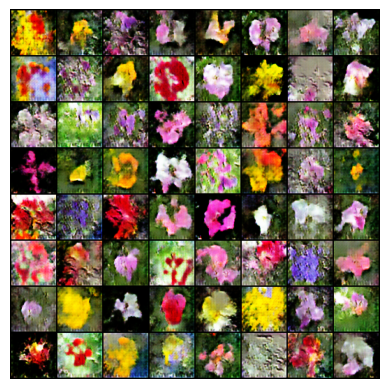

100%|██████████| 64/64 [00:28<00:00,  2.23it/s]


Epoch 46/150 | Loss_D: 0.9224 | Loss_G: 2.5031


100%|██████████| 64/64 [00:28<00:00,  2.27it/s]


Epoch 47/150 | Loss_D: 0.6469 | Loss_G: 2.5621


100%|██████████| 64/64 [00:28<00:00,  2.25it/s]


Epoch 48/150 | Loss_D: 0.5401 | Loss_G: 1.3830


100%|██████████| 64/64 [00:28<00:00,  2.25it/s]


Epoch 49/150 | Loss_D: 1.3875 | Loss_G: 4.6630


100%|██████████| 64/64 [00:29<00:00,  2.20it/s]


Epoch 50/150 | Loss_D: 0.7476 | Loss_G: 1.2171


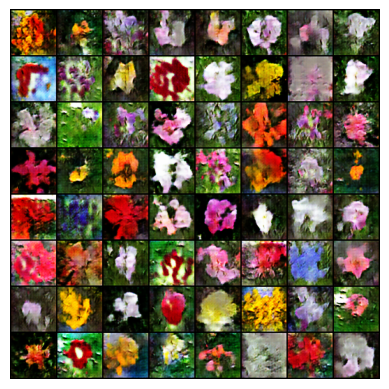

100%|██████████| 64/64 [00:28<00:00,  2.24it/s]


Epoch 51/150 | Loss_D: 0.8389 | Loss_G: 1.3884


100%|██████████| 64/64 [00:28<00:00,  2.24it/s]


Epoch 52/150 | Loss_D: 0.5632 | Loss_G: 2.5383


100%|██████████| 64/64 [00:28<00:00,  2.26it/s]


Epoch 53/150 | Loss_D: 0.6822 | Loss_G: 1.4785


100%|██████████| 64/64 [00:28<00:00,  2.25it/s]


Epoch 54/150 | Loss_D: 0.5733 | Loss_G: 1.8582


100%|██████████| 64/64 [00:28<00:00,  2.28it/s]


Epoch 55/150 | Loss_D: 1.1746 | Loss_G: 4.0791


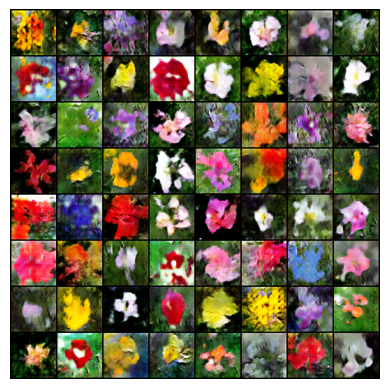

100%|██████████| 64/64 [00:27<00:00,  2.33it/s]


Epoch 56/150 | Loss_D: 0.7026 | Loss_G: 2.2791


100%|██████████| 64/64 [00:28<00:00,  2.27it/s]


Epoch 57/150 | Loss_D: 0.6829 | Loss_G: 1.3730


100%|██████████| 64/64 [00:29<00:00,  2.21it/s]


Epoch 58/150 | Loss_D: 0.4586 | Loss_G: 2.5084


100%|██████████| 64/64 [00:28<00:00,  2.24it/s]


Epoch 59/150 | Loss_D: 0.5187 | Loss_G: 2.1775


100%|██████████| 64/64 [00:28<00:00,  2.25it/s]


Epoch 60/150 | Loss_D: 0.5581 | Loss_G: 1.9408


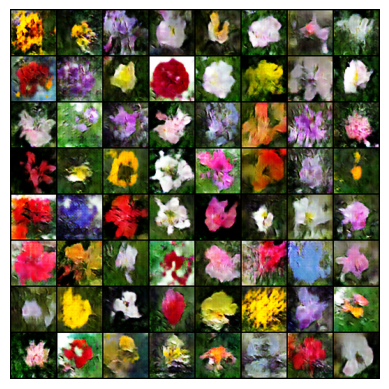

100%|██████████| 64/64 [00:29<00:00,  2.20it/s]


Epoch 61/150 | Loss_D: 0.4093 | Loss_G: 2.6342


100%|██████████| 64/64 [00:28<00:00,  2.25it/s]


Epoch 62/150 | Loss_D: 0.5581 | Loss_G: 1.7266


100%|██████████| 64/64 [00:29<00:00,  2.17it/s]


Epoch 63/150 | Loss_D: 1.5467 | Loss_G: 2.5008


100%|██████████| 64/64 [00:29<00:00,  2.14it/s]


Epoch 64/150 | Loss_D: 0.5481 | Loss_G: 1.9669


100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 65/150 | Loss_D: 0.9282 | Loss_G: 3.7122


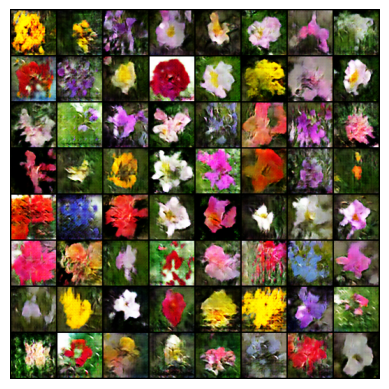

100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 66/150 | Loss_D: 0.5378 | Loss_G: 1.7088


100%|██████████| 64/64 [00:29<00:00,  2.19it/s]


Epoch 67/150 | Loss_D: 0.6735 | Loss_G: 2.0684


100%|██████████| 64/64 [00:29<00:00,  2.17it/s]


Epoch 68/150 | Loss_D: 0.4090 | Loss_G: 2.8099


100%|██████████| 64/64 [00:29<00:00,  2.15it/s]


Epoch 69/150 | Loss_D: 0.6279 | Loss_G: 3.4183


100%|██████████| 64/64 [00:29<00:00,  2.19it/s]


Epoch 70/150 | Loss_D: 0.4530 | Loss_G: 2.1685


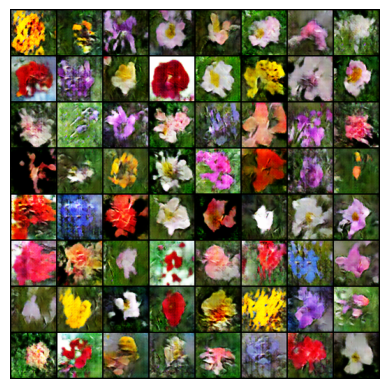

100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 71/150 | Loss_D: 1.1247 | Loss_G: 2.9281


100%|██████████| 64/64 [00:29<00:00,  2.17it/s]


Epoch 72/150 | Loss_D: 0.5125 | Loss_G: 1.6514


100%|██████████| 64/64 [00:29<00:00,  2.17it/s]


Epoch 73/150 | Loss_D: 0.4713 | Loss_G: 2.3776


100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 74/150 | Loss_D: 0.4735 | Loss_G: 3.3968


100%|██████████| 64/64 [00:28<00:00,  2.21it/s]


Epoch 75/150 | Loss_D: 0.5438 | Loss_G: 3.4164


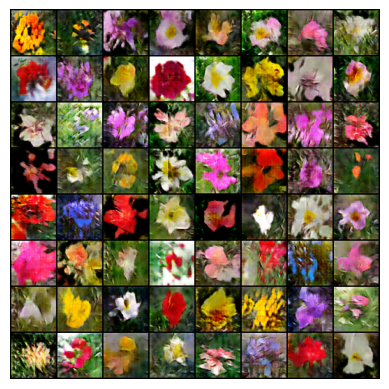

100%|██████████| 64/64 [00:29<00:00,  2.15it/s]


Epoch 76/150 | Loss_D: 0.6382 | Loss_G: 1.4851


100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 77/150 | Loss_D: 0.8377 | Loss_G: 4.2923


100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 78/150 | Loss_D: 0.4302 | Loss_G: 2.8758


100%|██████████| 64/64 [00:29<00:00,  2.13it/s]


Epoch 79/150 | Loss_D: 0.4173 | Loss_G: 2.5950


100%|██████████| 64/64 [00:29<00:00,  2.17it/s]


Epoch 80/150 | Loss_D: 0.4963 | Loss_G: 2.6579


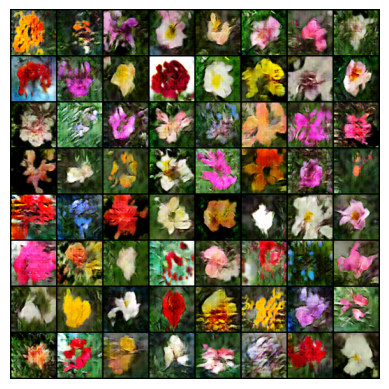

100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 81/150 | Loss_D: 0.4435 | Loss_G: 1.8982


100%|██████████| 64/64 [00:30<00:00,  2.10it/s]


Epoch 82/150 | Loss_D: 0.7057 | Loss_G: 1.4627


100%|██████████| 64/64 [00:29<00:00,  2.18it/s]


Epoch 83/150 | Loss_D: 0.5139 | Loss_G: 1.9805


100%|██████████| 64/64 [00:29<00:00,  2.15it/s]


Epoch 84/150 | Loss_D: 0.3711 | Loss_G: 2.7154


100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 85/150 | Loss_D: 0.5350 | Loss_G: 2.4613


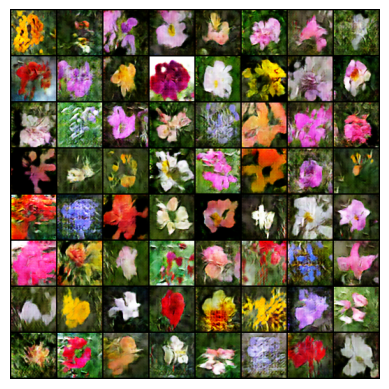

100%|██████████| 64/64 [00:29<00:00,  2.14it/s]


Epoch 86/150 | Loss_D: 0.3147 | Loss_G: 2.8561


100%|██████████| 64/64 [00:29<00:00,  2.16it/s]


Epoch 87/150 | Loss_D: 0.3368 | Loss_G: 2.0482


100%|██████████| 64/64 [00:30<00:00,  2.11it/s]


Epoch 88/150 | Loss_D: 0.3849 | Loss_G: 3.0412


100%|██████████| 64/64 [00:30<00:00,  2.13it/s]


Epoch 89/150 | Loss_D: 0.5004 | Loss_G: 3.0404


100%|██████████| 64/64 [00:29<00:00,  2.14it/s]


Epoch 90/150 | Loss_D: 0.2571 | Loss_G: 3.4173


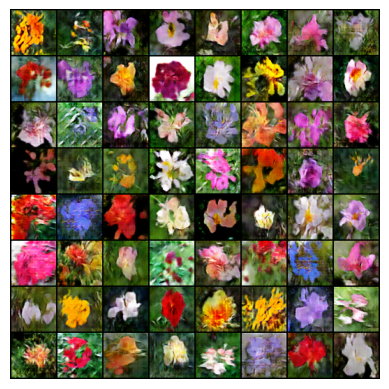

100%|██████████| 64/64 [00:30<00:00,  2.12it/s]


Epoch 91/150 | Loss_D: 0.4051 | Loss_G: 2.6499


100%|██████████| 64/64 [00:30<00:00,  2.10it/s]


Epoch 92/150 | Loss_D: 0.3780 | Loss_G: 1.5553


100%|██████████| 64/64 [00:29<00:00,  2.15it/s]


Epoch 93/150 | Loss_D: 0.3305 | Loss_G: 2.5598


100%|██████████| 64/64 [00:30<00:00,  2.10it/s]


Epoch 94/150 | Loss_D: 0.4949 | Loss_G: 4.4653


100%|██████████| 64/64 [00:30<00:00,  2.09it/s]


Epoch 95/150 | Loss_D: 0.6299 | Loss_G: 3.1812


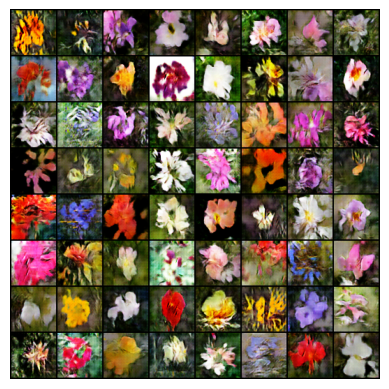

100%|██████████| 64/64 [00:30<00:00,  2.12it/s]


Epoch 96/150 | Loss_D: 0.2782 | Loss_G: 3.0010


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch 97/150 | Loss_D: 0.2849 | Loss_G: 2.2607


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch 98/150 | Loss_D: 0.4205 | Loss_G: 2.3352


100%|██████████| 64/64 [00:30<00:00,  2.12it/s]


Epoch 99/150 | Loss_D: 2.1175 | Loss_G: 0.0465


100%|██████████| 64/64 [00:30<00:00,  2.09it/s]


Epoch 100/150 | Loss_D: 0.3379 | Loss_G: 2.8345


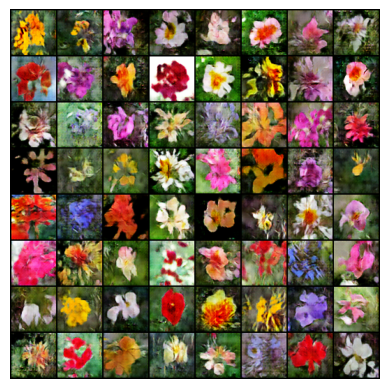

100%|██████████| 64/64 [00:30<00:00,  2.10it/s]


Epoch 101/150 | Loss_D: 0.2849 | Loss_G: 3.6825


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch 102/150 | Loss_D: 0.3746 | Loss_G: 2.9595


100%|██████████| 64/64 [00:30<00:00,  2.09it/s]


Epoch 103/150 | Loss_D: 0.2360 | Loss_G: 3.2663


100%|██████████| 64/64 [00:30<00:00,  2.10it/s]


Epoch 104/150 | Loss_D: 0.4132 | Loss_G: 3.0746


100%|██████████| 64/64 [00:30<00:00,  2.08it/s]


Epoch 105/150 | Loss_D: 0.5061 | Loss_G: 3.1070


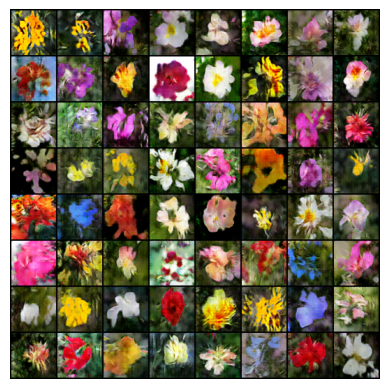

100%|██████████| 64/64 [00:30<00:00,  2.08it/s]


Epoch 106/150 | Loss_D: 0.5644 | Loss_G: 1.4779


100%|██████████| 64/64 [00:31<00:00,  2.04it/s]


Epoch 107/150 | Loss_D: 0.2714 | Loss_G: 2.3953


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch 108/150 | Loss_D: 0.4165 | Loss_G: 3.2639


100%|██████████| 64/64 [00:30<00:00,  2.12it/s]


Epoch 109/150 | Loss_D: 0.2865 | Loss_G: 2.9078


100%|██████████| 64/64 [00:30<00:00,  2.08it/s]


Epoch 110/150 | Loss_D: 0.3493 | Loss_G: 2.4918


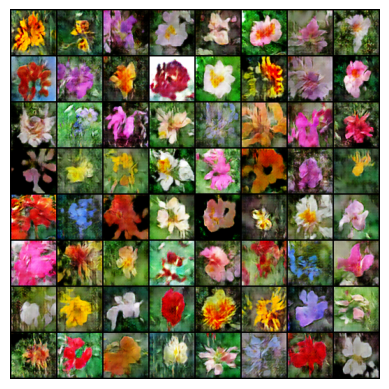

100%|██████████| 64/64 [00:31<00:00,  2.06it/s]


Epoch 111/150 | Loss_D: 0.3060 | Loss_G: 2.7861


100%|██████████| 64/64 [00:30<00:00,  2.09it/s]


Epoch 112/150 | Loss_D: 0.9177 | Loss_G: 0.7051


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch 113/150 | Loss_D: 0.2648 | Loss_G: 2.3560


100%|██████████| 64/64 [00:31<00:00,  2.05it/s]


Epoch 114/150 | Loss_D: 0.4264 | Loss_G: 1.9804


100%|██████████| 64/64 [00:30<00:00,  2.07it/s]


Epoch 115/150 | Loss_D: 0.3619 | Loss_G: 3.0491


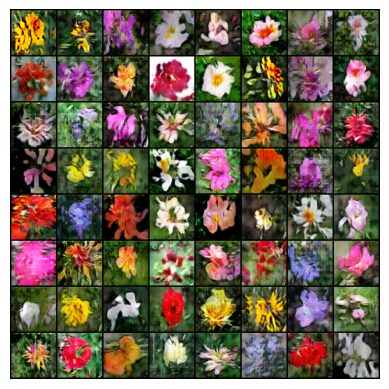

100%|██████████| 64/64 [00:31<00:00,  2.02it/s]


Epoch 116/150 | Loss_D: 0.2906 | Loss_G: 4.2363


100%|██████████| 64/64 [00:31<00:00,  2.04it/s]


Epoch 117/150 | Loss_D: 0.5553 | Loss_G: 5.3771


100%|██████████| 64/64 [00:32<00:00,  1.99it/s]


Epoch 118/150 | Loss_D: 0.2927 | Loss_G: 3.9180


100%|██████████| 64/64 [00:30<00:00,  2.08it/s]


Epoch 119/150 | Loss_D: 0.3673 | Loss_G: 2.3097


100%|██████████| 64/64 [00:31<00:00,  2.06it/s]


Epoch 120/150 | Loss_D: 0.2553 | Loss_G: 4.0832


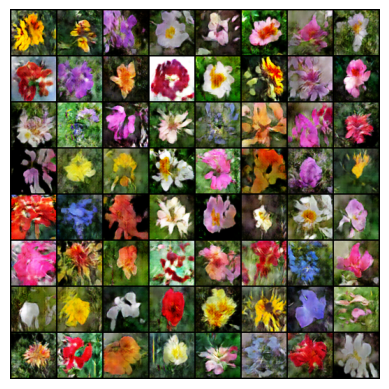

100%|██████████| 64/64 [00:31<00:00,  2.03it/s]


Epoch 121/150 | Loss_D: 0.2477 | Loss_G: 2.6594


100%|██████████| 64/64 [00:31<00:00,  2.05it/s]


Epoch 122/150 | Loss_D: 0.2477 | Loss_G: 3.2603


100%|██████████| 64/64 [00:31<00:00,  2.05it/s]


Epoch 123/150 | Loss_D: 1.0355 | Loss_G: 6.7987


100%|██████████| 64/64 [00:31<00:00,  2.06it/s]


Epoch 124/150 | Loss_D: 0.4966 | Loss_G: 4.3827


100%|██████████| 64/64 [00:31<00:00,  2.03it/s]


Epoch 125/150 | Loss_D: 0.7118 | Loss_G: 2.2405


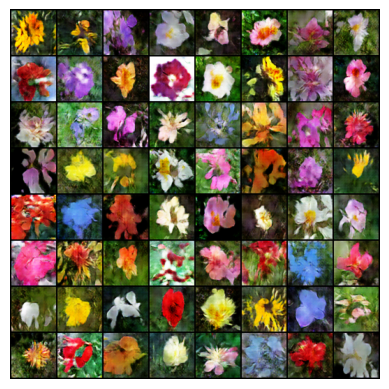

100%|██████████| 64/64 [00:31<00:00,  2.05it/s]


Epoch 126/150 | Loss_D: 0.2799 | Loss_G: 2.7608


100%|██████████| 64/64 [00:31<00:00,  2.01it/s]


Epoch 127/150 | Loss_D: 0.1924 | Loss_G: 4.3165


100%|██████████| 64/64 [00:31<00:00,  2.01it/s]


Epoch 128/150 | Loss_D: 0.2523 | Loss_G: 3.2378


100%|██████████| 64/64 [00:32<00:00,  1.99it/s]


Epoch 129/150 | Loss_D: 0.3328 | Loss_G: 4.4854


100%|██████████| 64/64 [00:31<00:00,  2.01it/s]


Epoch 130/150 | Loss_D: 0.8236 | Loss_G: 3.2741


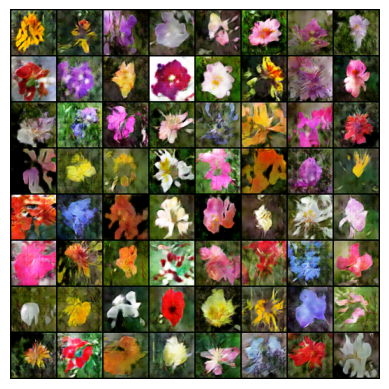

100%|██████████| 64/64 [00:31<00:00,  2.03it/s]


Epoch 131/150 | Loss_D: 0.2485 | Loss_G: 2.9601


100%|██████████| 64/64 [00:31<00:00,  2.04it/s]


Epoch 132/150 | Loss_D: 0.2309 | Loss_G: 3.7583


100%|██████████| 64/64 [00:32<00:00,  1.98it/s]


Epoch 133/150 | Loss_D: 0.1634 | Loss_G: 3.8427


100%|██████████| 64/64 [00:32<00:00,  1.99it/s]


Epoch 134/150 | Loss_D: 0.1891 | Loss_G: 3.7207


100%|██████████| 64/64 [00:32<00:00,  1.99it/s]


Epoch 135/150 | Loss_D: 0.2490 | Loss_G: 3.9634


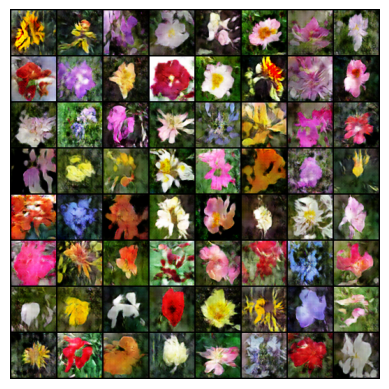

100%|██████████| 64/64 [00:31<00:00,  2.02it/s]


Epoch 136/150 | Loss_D: 0.1794 | Loss_G: 3.9176


100%|██████████| 64/64 [00:31<00:00,  2.02it/s]


Epoch 137/150 | Loss_D: 1.8542 | Loss_G: 1.0625


100%|██████████| 64/64 [00:32<00:00,  1.98it/s]


Epoch 138/150 | Loss_D: 0.1914 | Loss_G: 2.9439


100%|██████████| 64/64 [00:32<00:00,  2.00it/s]


Epoch 139/150 | Loss_D: 0.1620 | Loss_G: 3.4632


100%|██████████| 64/64 [00:34<00:00,  1.86it/s]


Epoch 140/150 | Loss_D: 0.3193 | Loss_G: 3.9558


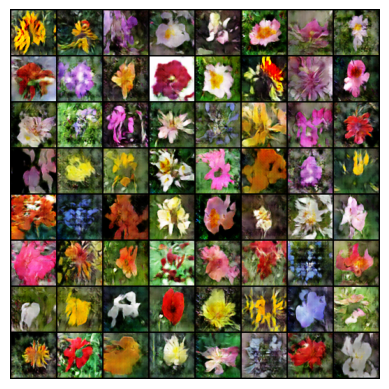

100%|██████████| 64/64 [00:32<00:00,  1.98it/s]


Epoch 141/150 | Loss_D: 0.1802 | Loss_G: 3.1605


100%|██████████| 64/64 [00:32<00:00,  1.99it/s]


Epoch 142/150 | Loss_D: 0.1423 | Loss_G: 2.7441


100%|██████████| 64/64 [00:32<00:00,  1.95it/s]


Epoch 143/150 | Loss_D: 0.1828 | Loss_G: 3.5204


100%|██████████| 64/64 [00:32<00:00,  1.95it/s]


Epoch 144/150 | Loss_D: 0.1667 | Loss_G: 3.4937


100%|██████████| 64/64 [00:31<00:00,  2.02it/s]


Epoch 145/150 | Loss_D: 0.2682 | Loss_G: 2.0933


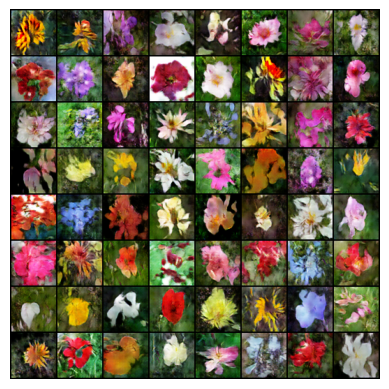

100%|██████████| 64/64 [00:33<00:00,  1.93it/s]


Epoch 146/150 | Loss_D: 0.2319 | Loss_G: 3.6275


100%|██████████| 64/64 [00:32<00:00,  1.95it/s]


Epoch 147/150 | Loss_D: 0.2087 | Loss_G: 4.3880


100%|██████████| 64/64 [00:33<00:00,  1.94it/s]


Epoch 148/150 | Loss_D: 1.4622 | Loss_G: 1.3908


100%|██████████| 64/64 [00:32<00:00,  1.95it/s]


Epoch 149/150 | Loss_D: 0.1595 | Loss_G: 3.5187


100%|██████████| 64/64 [00:32<00:00,  1.97it/s]


Epoch 150/150 | Loss_D: 0.1980 | Loss_G: 3.4888


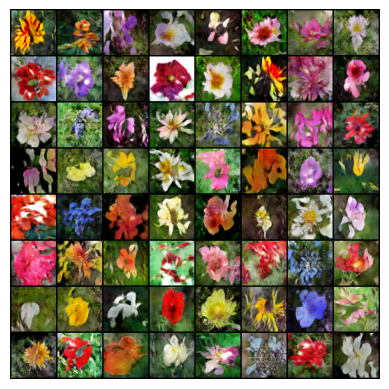

Training finished! Images saved to: /content/drive/MyDrive/dcgan_flowers_64


In [18]:
generator = Generator(Z_DIM).to(DEVICE)
discriminator = Discriminator().to(DEVICE)
generator.apply(weights_init)
discriminator.apply(weights_init)
loss = nn.BCELoss()
optimizerG = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerD = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
fixed_noise = torch.randn(64, Z_DIM, 1, 1, device=DEVICE)

print("Starting training...")

for epoch in range(1, EPOCHS + 1):
    for real in tqdm(dataloader):
        real = real.to(DEVICE)
        b = real.size(0)

        real_labels = torch.ones(b, device=DEVICE)
        fake_labels = torch.zeros(b, device=DEVICE)

        discriminator.zero_grad()

        output_real = discriminator(real).view(-1)
        loss_real = loss(output_real, real_labels)

        noise = torch.randn(b, Z_DIM, 1, 1, device=DEVICE)
        fake = generator(noise)

        output_fake = discriminator(fake.detach()).view(-1)
        loss_fake = loss(output_fake, fake_labels)

        loss_D = loss_real + loss_fake
        loss_D.backward()
        optimizerD.step()

        generator.zero_grad()

        noise = torch.randn(b, Z_DIM, 1, 1, device=DEVICE)
        generated = generator(noise)

        output_gen = discriminator(generated).view(-1)
        loss_G = loss(output_gen, real_labels)

        loss_G.backward()
        optimizerG.step()

    print(f"Epoch {epoch}/{EPOCHS} | Loss_D: {loss_D.item():.4f} | Loss_G: {loss_G.item():.4f}")

    if epoch % 5 == 0 or epoch == 1:
        with torch.no_grad():
            sample = generator(fixed_noise).cpu()
        grid = make_grid(sample, nrow=8, normalize=True)

        save_image(grid, f"{OUTPUT_DIR}/preview_epoch_{epoch:03d}.png")

        plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
        plt.axis("off")
        plt.show()

    if epoch % 10 == 0:
        torch.save(generator.state_dict(), f"{OUTPUT_DIR}/G_epoch_{epoch}.pth")
        torch.save(discriminator.state_dict(), f"{OUTPUT_DIR}/D_epoch_{epoch}.pth")

print("Training finished! Images saved to:", OUTPUT_DIR)

## Comparing Generated Images to Authentic Samples

To visually assess the quality of the model's outputs, a real flower image is randomly selected from the dataset and resized to 64x64 pixels, the same resolution used during training. This real image is then displayed alongside a newly generated sample from the trained DCGAN. Presenting both images side-by-side provides a straightforward qualitative comparison between authentic samples and the model's synthetic outputs.


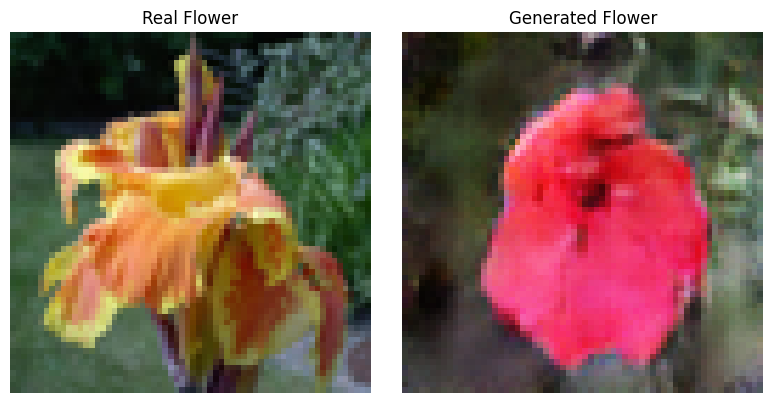

In [22]:
random_img = random.choice(os.listdir(IMAGE_FOLDER))
img_path = os.path.join(IMAGE_FOLDER, random_img)

real_img = Image.open(img_path).convert("RGB")
real_img_64 = real_img.resize((64, 64), Image.BICUBIC)

netG = Generator(Z_DIM).to("cpu")
netG.load_state_dict(torch.load("/content/drive/MyDrive/dcgan_flowers_64/G_epoch_150.pth", map_location="cpu"))
netG.eval()

noise = torch.randn(1, Z_DIM, 1, 1)
with torch.no_grad():
    fake_img = netG(noise)

np_fake = fake_img.squeeze().detach().numpy()
np_fake = (np.transpose(np_fake, (1, 2, 0)) + 1) / 2

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].imshow(real_img_64)
axes[0].set_title("Real Flower")
axes[0].axis("off")

axes[1].imshow(np_fake)
axes[1].set_title("Generated Flower")
axes[1].axis("off")

plt.tight_layout()
plt.show()